In [ ]:
# Install fastai if not already installed
!pip install fastai

# Import libraries
from fastai.vision.all import *
from fastai.vision.widgets import * # Import ImageClassifierCleaner
import pandas as pd
import numpy as np
from pathlib import Path

In [ ]:
# Download data source from Kaggle
!pip install kaggle

# Step 2: Setup Kaggle API credentials
import json
import os

# Create kaggle.json file with your credentials
kaggle_credentials = {
    "username": "habutusk",
    "key": "f7b70d33ed6cd138cbe8439ce5232a3a"
}

# Create .kaggle directory and save credentials
os.makedirs('/root/.kaggle', exist_ok=True)
with open('/root/.kaggle/kaggle.json', 'w') as f:
    json.dump(kaggle_credentials, f)

# Set proper permissions
os.chmod('/root/.kaggle/kaggle.json', 0o600)

print("Kaggle API credentials configured successfully!")

# Step 3: Download the dataset
!kaggle datasets download -d dansbecker/hot-dog-not-hot-dog
!unzip -q hot-dog-not-hot-dog.zip


Kaggle API credentials configured successfully!
Dataset URL: https://www.kaggle.com/datasets/dansbecker/hot-dog-not-hot-dog
License(s): other
hot-dog-not-hot-dog.zip: Skipping, found more recently modified local copy (use --force to force download)
replace seefood/test/hot_dog/133012.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
data_path = Path('/content/train')
test_path = Path('/content/test')

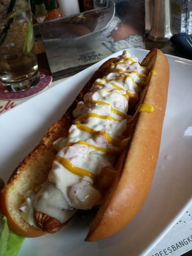

In [ ]:
# Check Hotdog data your data
train_hotdog_files = get_image_files(data_path/'hot_dog')
train_not_hotdog_files = get_image_files(data_path/'not_hot_dog')
test_hotdog_files = get_image_files(test_path/'hot_dog')
test_not_hotdog_files = get_image_files(test_path/'not_hot_dog')

# Check Hotdog data
im = Image.open(train_hotdog_files[0])
im.to_thumb(256,256)


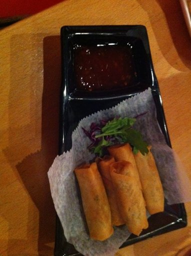

In [ ]:
# Check Not Hotdog data
im = Image.open(train_not_hotdog_files[5])
im.to_thumb(256,256)

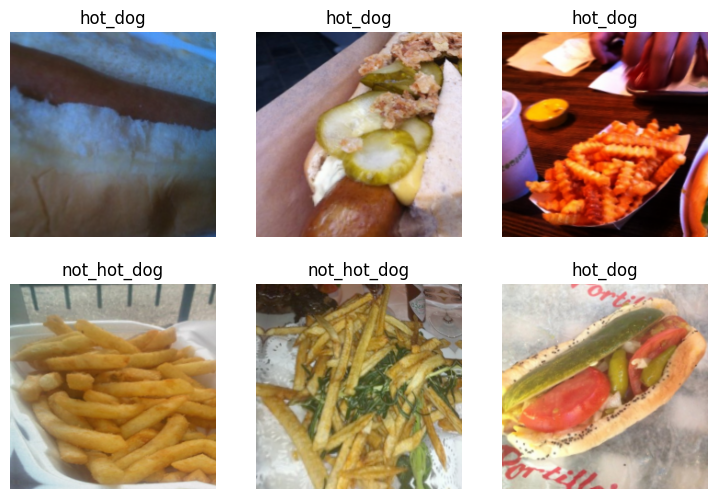

In [ ]:
# Train images
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[RandomResizedCrop(224, min_scale=0.5)],
    batch_tfms=aug_transforms(mult=1)
).dataloaders(data_path, bs=32) # Call dataloaders with the data path

dls.show_batch(max_n=6)

In [ ]:
learn = vision_learner(dls, resnet50, metrics=error_rate)
learn.fine_tune(20)

print("✅ Training completed!")

epoch,train_loss,valid_loss,error_rate,time
0,0.992838,0.528558,0.151515,00:04


epoch,train_loss,valid_loss,error_rate,time
0,0.670289,0.539370,0.191919,00:05
1,0.485151,0.524926,0.191919,00:05
2,0.426346,0.431694,0.171717,00:05
3,0.376775,0.396984,0.111111,00:05
4,0.334737,0.449537,0.111111,00:05
5,0.305466,0.538036,0.111111,00:05
6,0.260801,0.465199,0.111111,00:05
7,0.235780,0.403697,0.121212,00:05
8,0.219396,0.365856,0.101010,00:05
9,0.190896,0.331112,0.070707,00:04


✅ Training completed!


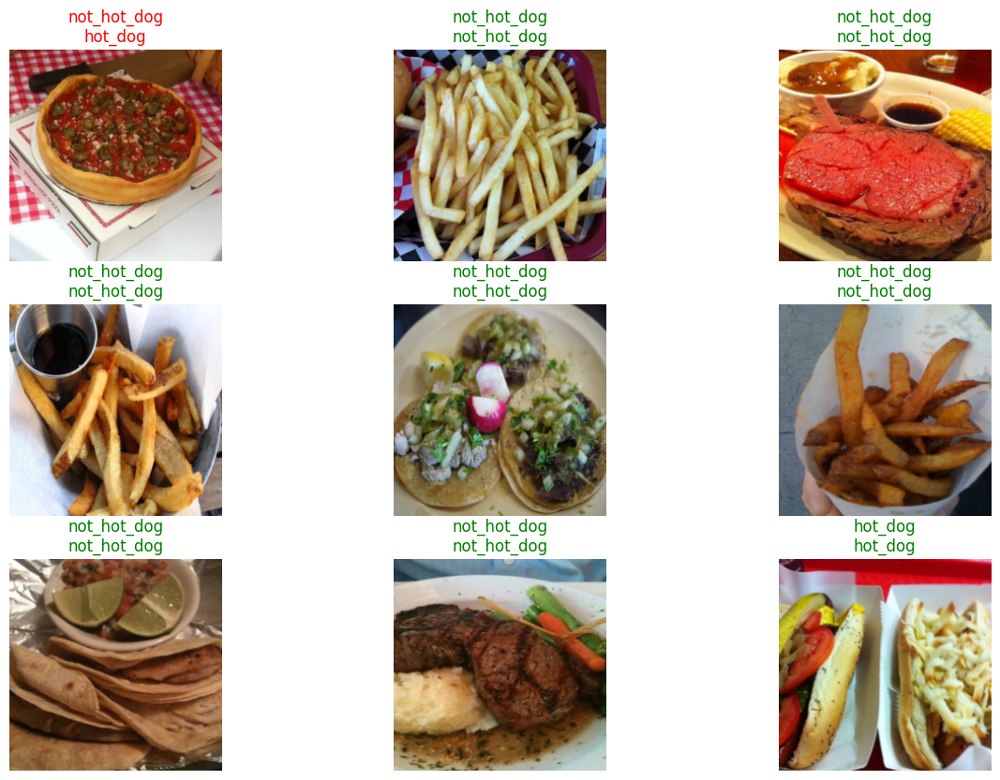

In [ ]:
# sample predictions
learn.show_results(max_n=9, figsize=(15, 10))

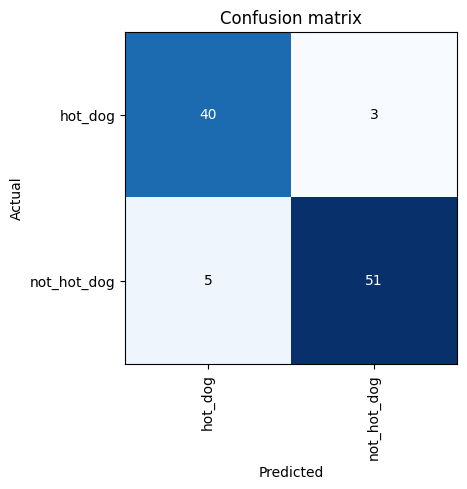

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

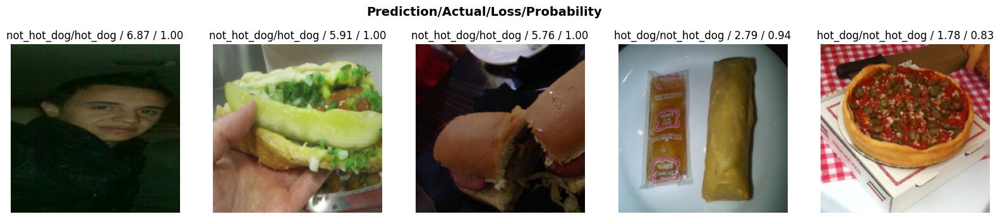

In [ ]:
interp.plot_top_losses(5, nrows=1, figsize=(20,4))

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx, hotdog in cleaner.change(): shutil.move(str(cleaner.fns[idx], path/hotdog))

In [ ]:
learn.export('model.pkl')

In [2]:
!python --version

Python 3.12.11


In [3]:
!pip freeze

absl-py==1.4.0
absolufy-imports==0.3.1
accelerate==1.10.1
aiofiles==24.1.0
aiohappyeyeballs==2.6.1
aiohttp==3.12.15
aiosignal==1.4.0
alabaster==1.0.0
albucore==0.0.24
albumentations==2.0.8
ale-py==0.11.2
alembic==1.16.5
altair==5.5.0
annotated-types==0.7.0
antlr4-python3-runtime==4.9.3
anyio==4.10.0
anywidget==0.9.18
argon2-cffi==25.1.0
argon2-cffi-bindings==25.1.0
array_record==0.8.1
arrow==1.3.0
arviz==0.22.0
astropy==7.1.0
astropy-iers-data==0.2025.9.8.0.36.17
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
Authlib==1.6.3
autograd==1.8.0
babel==2.17.0
backcall==0.2.0
beartype==0.21.0
beautifulsoup4==4.13.5
betterproto==2.0.0b6
bigframes==2.19.0
bigquery-magics==0.10.3
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blobfile==3.1.0
blosc2==3.7.2
bokeh==3.7.3
Bottleneck==1.4.2
bqplot==0.12.45
branca==0.8.1
Brotli==1.1.0
build==1.3.0
CacheControl==0.14.3
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.8.3
cffi==2.0.0
chardet==5.2.0
charset-normalizer==3.4.3
chex==0.1.90
clara